# Laboratorium 1 — Życie na krawędzi

## Wprowadzenie

W tym laboratorium (jak i pewnie w każdym następnym 😛) będę korzystać z PyTorch
do operacji na tensorach i sieciach neuronowych.

## Import odpowiednich paczek i definicja użytecznych funkcji

In [1]:
from typing import Any
import IPython.display as d
import torch
import torch.nn as nn
import torchvision.transforms as T
import numpy as np
from PIL import Image

pil_to_tensor = T.PILToTensor()
tensor_to_pil = T.ToPILImage()


def to_grayscale(image: torch.Tensor) -> torch.Tensor:
    convolve = nn.Conv2d(
        in_channels=3,
        out_channels=1,
        kernel_size=1,
        bias=False
    )

    # ITU-R 601-2
    grayscale_weights = [0.299, 0.587, 0.114]

    convolve.weight = nn.Parameter(
        torch.tensor(grayscale_weights).view(1, 3, 1, 1),
        requires_grad=False
    )

    return convolve(image)


def load_image(path: str, grayscale = False) -> torch.Tensor:
    image: torch.Tensor = pil_to_tensor(Image.open(path))[:3, :, :] / 255.0

    if not grayscale:
        return image
    return to_grayscale(image)


def display(*images: np.ndarray | torch.Tensor) -> None:
    if (len(images) == 0):
        return

    images = [image * 255.0 for image in images]

    pil_images: list[Image.Image] | None = None
    if isinstance(images[0], torch.Tensor):
        pil_images = [tensor_to_pil(image.to(torch.uint8)) for image in images]
    else:
        pil_images = [
            Image.fromarray(image.astype(np.uint8)) for image in images
        ]

    d.display(*pil_images)


def average_pooling(image: torch.Tensor, kernel_size: int) -> torch.Tensor:
    return nn.AvgPool2d(kernel_size)(image)


def gaussian_kernel(size: int, sigma: float = 1.0) -> torch.Tensor:
    half_size: int = size // 2
    i, j = (np.mgrid[-half_size:half_size + 1, -half_size:half_size+1]) \
        .astype(np.float32)

    gaussian_kernel = torch.from_numpy(
        np.exp(-(i**2 + j**2) / (2.0 * sigma**2)),
    )
    gaussian_kernel /= gaussian_kernel.sum()

    return gaussian_kernel


def upscale(image: torch.Tensor, target_size: tuple[int, int]) -> torch.Tensor:
    return torch.squeeze(nn.Upsample(target_size)(
        image.view(1, 1, *image.shape)
    ))


def apply_detected_edges_to_image(
        image: torch.Tensor,
        edges: torch.Tensor
        ) -> torch.Tensor:
    image = image[:, :, :]
    image[0][edges == 1.0] = 0.0
    image[1][edges == 1.0] = 0.0
    image[2][edges == 1.0] = 1.0

    return image


### Główna klasa do detekcji krawędzi metodą Canny'ego

Posiada kilka metod, które mają za zadanie zostać wykonane sekwencyjnie
i w finalnym rozrachunku przekształcić wejściowy obraz do binarych wykrytych
krawędzi:

- `guassian_blur`,
- `sobel`,
- `nonmax_suppression`,
- `threshold`.

In [2]:
class CannyEdgeDetector(nn.Module):
    def __init__(self, **kwargs: Any) -> None:
        super().__init__()

        self.image: torch.Tensor | None = None
        self.image_size: tuple[int, int] | None = None
        self.gradient_magnitudes: torch.Tensor | None = None
        self.gradient_directions: torch.Tensor | None = None

        self.gaussian_size: int = kwargs.get("guassian_kernel_size", 3)
        self.gaussian_sigma: float = kwargs.get("guassian_sigma", 1.0)
        self.t: float = kwargs.get("threshold", 0.0)

    def set_image(self, image: torch.Tensor) -> None:
        self.image = image
        self.image_size = image.shape

    def forward(self, image: torch.Tensor) -> torch.Tensor:
        self.set_image(image)
        self.guassian_blur(self.gaussian_size, self.gaussian_sigma)
        self.sobel()
        self.nonmax_suppression()
        self.threshold(self.t)

        return self.image

    def guassian_blur(
            self,
            kernel_size: int,
            sigma: float = 1.0
            ) -> torch.Tensor:
        convolve = nn.Conv2d(
            in_channels=1,
            out_channels=1,
            kernel_size=kernel_size,
            padding=kernel_size // 2,
            bias=False
        )

        kernel = gaussian_kernel(kernel_size, sigma)
        convolve.weight = nn.Parameter(
            kernel.view(1, 1, kernel_size, kernel_size),
            requires_grad=False
        )

        self.image = convolve(self.image)

        return self.image

    def sobel(self) -> torch.Tensor:
        sobel_kernel_y = torch.tensor([
            [1,   2,  1],
            [0,   0,  0],
            [-1, -2, -1],
        ], dtype=torch.float)
        sobel_kernel_x = torch.tensor([
            [1,   0, -1],
            [2,   0, -2],
            [1,   0, -1],
        ], dtype=torch.float)

        convolve_gradient = nn.Conv2d(
            in_channels=1,
            out_channels=2,
            kernel_size=3,
            padding=1,
            bias=False
        )
        convolve_gradient.weight = nn.Parameter(
            torch.stack((sobel_kernel_y, sobel_kernel_x)) \
                .view(2, 1, 3, 3),
            requires_grad=False
        )

        convolution_result: torch.Tensor = convolve_gradient(
            self.image
        )

        self.gradient_magnitudes = convolution_result.pow(2).sum(dim=0).sqrt()
        self.gradient_magnitudes \
            = self.gradient_magnitudes / self.gradient_magnitudes.max()
        self.gradient_directions = torch.atan2(*convolution_result)

        self.image = self.gradient_magnitudes

        return self.image

    def nonmax_suppression(self) -> torch.Tensor:
        M, N = self.image.shape
        S = torch.zeros((M, N), dtype=torch.float)
        angle = self.gradient_directions * 180.0 / np.pi
        angle[angle < 0.0] += 180

        for i in range(1, M - 1):
            for j in range(1, N - 1):
                q = 1.0
                r = 1.0

                # 0°
                if (
                    0.0 <= angle[i, j] < 22.5
                    or 157.5 <= angle[i, j] <= 180.0
                ):
                    q = self.image[i, j + 1]
                    r = self.image[i, j - 1]
                # 45°
                elif (22.5 <= angle[i, j] < 67.5):
                    q = self.image[i + 1, j - 1]
                    r = self.image[i - 1, j + 1]
                # 90°
                elif (67.5 <= angle[i, j] < 112.5):
                    q = self.image[i + 1, j]
                    r = self.image[i - 1, j]
                # 135°
                elif (112.5 <= angle[i, j] < 157.5):
                    q = self.image[i - 1, j - 1]
                    r = self.image[i + 1, j + 1]

                if self.image[i, j] >= q and self.image[i, j] >= r:
                    S[i, j] = self.image[i, j]
                else:
                    S[i, j] = 0.0

        self.image = S

        return self.image

    def threshold(self, threshold: float) -> torch.Tensor:
        self.image = nn.Threshold(threshold, 0.0)(
            self.image
        )
        self.image[self.image >= threshold] = 1.0
        return self.image

## Wczytanie obrazu, znormalizowanie go i transformacja do przestrzeni barw szarości

Do wczytywania obrazów wykorzystałem bibliotekę Pillow, którą używam do
załadowania obrazu w formacie RGB. Następnie ten obraz przekształcam do
odcieni barw szarości za pomocą konwolucji $1 \times 1$.

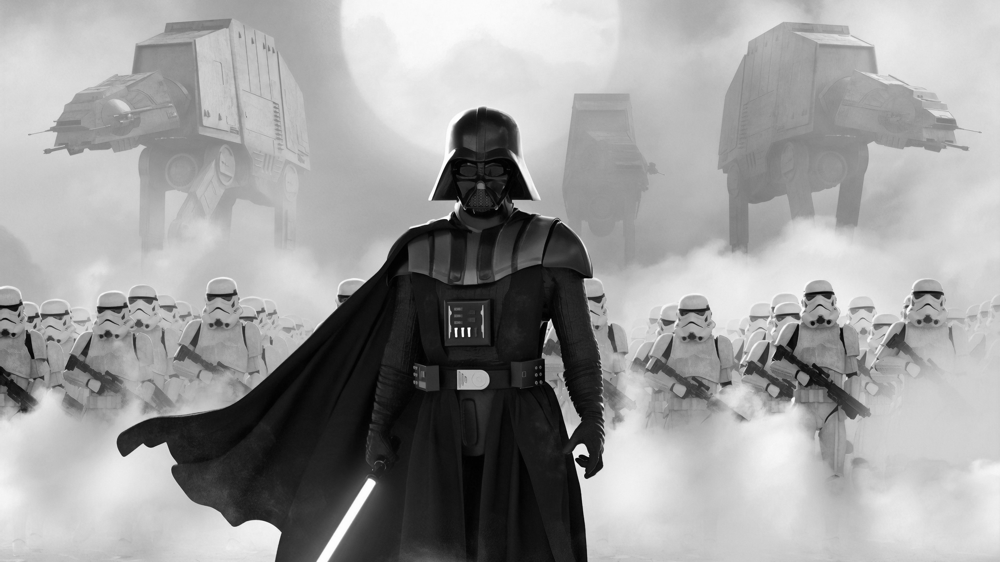

In [3]:
base_image = load_image("darth-vader.jpg")
image = load_image("darth-vader.jpg", grayscale=True)
display(image)

## Zmniejszenie obrazu (downscaling)

Zdecydowałem się wybrać average pooling z powodu uśrednienia krawędzi, dzięki
temu obraz się rozmyje (będzie trzeba zastosować mniejsze rozmycie w następnym
kroku). Przy wybraniu maximum pooling w każdym kawałku $4 \times 4$ wybierany jest
najaśniejszy piksel, przekłada się to na większe wyostrzenie obrazu, na większe
jego zniekształcenie w lokalnych punktach (maksimum). 

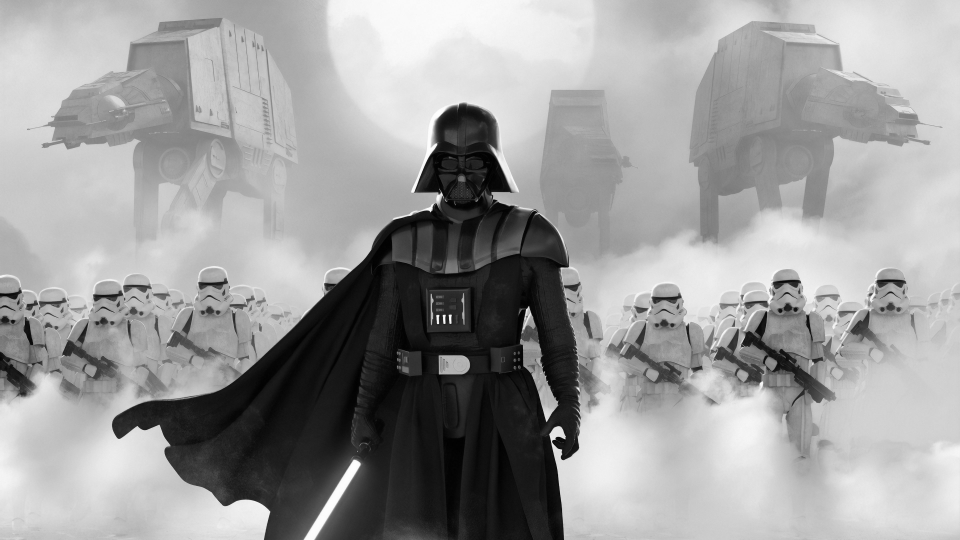

In [4]:
image = average_pooling(image, kernel_size=4)
display(image)

## Zainicjalizowanie obiektu do detekcji krawędzi

In [5]:
canny = CannyEdgeDetector()
canny.set_image(image)

## Rozmycie gaussowskie (redukcja szumów)

Do rozmycia posłuży gaussowski filtr $3 \times 3$ o odchyleniu standardowym
$\sigma = 0.4666$.

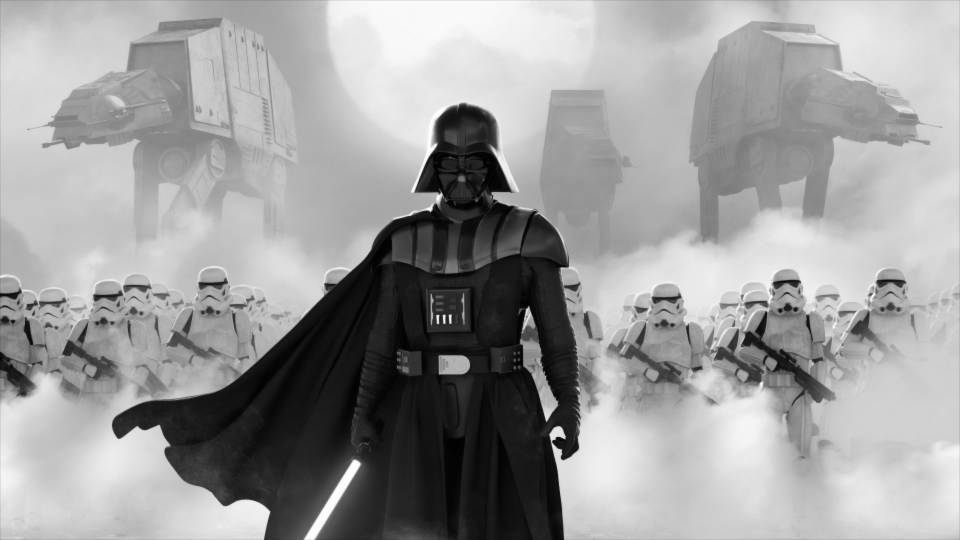

In [6]:
image = canny.guassian_blur(kernel_size=3, sigma=0.4666)
display(image)

## Gradient intensywności

W tym kroku dochodzi do detekcji krawędzi w dwóch osiach, pionowej i poziomej.
Do wyznaczenia wartości w danym pikselu posłuży nam odległość wektora
wyznaczonego przez obie osie ($\sqrt{G_y^2 + G_x^2}$). Kierunek spadku jest
obliczany za pomocą funkcji $\text{atan2}$.

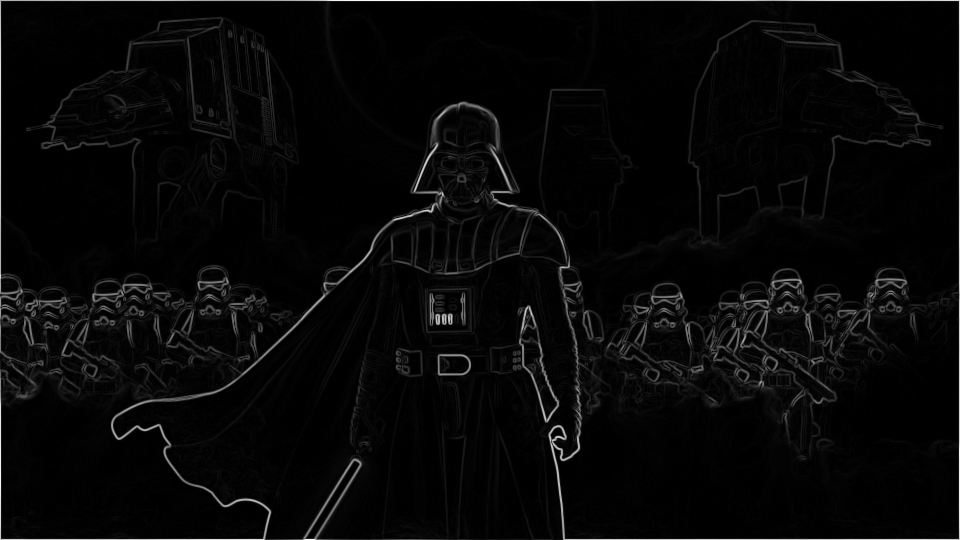

In [7]:
image = canny.sobel()
display(image)

## Redukcja lokalnych niemaksimów gradientu intensywności (non-maximum suppression)

Na powyższym obrazku widać, że krawędzie są zbyt grube w wielu miejscach.
Trzeba je zatem wyszuplić i pozostawić tylko te najbardziej dominujące lokalnie.
Można to osiągnąć za pomocą non-maximum suppression, które działa na podstawie
wyliczonego w poprzednim kroku gradientu oraz jego kierunku.

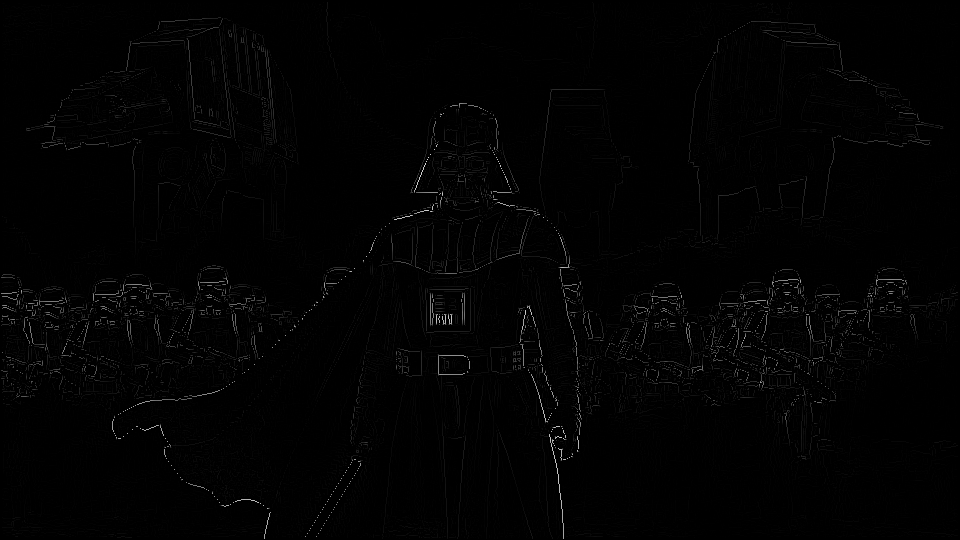

In [8]:
image = canny.nonmax_suppression()
display(image)

## Progowanie

W tym kroku pomineliśmy podwójne progowanie, które dzieli wykryty piksel
krawędzi na 3 klasy: mocną, słabą i niezwiązaną; w naszym sposobie są tylko 2:
mocna i niezwiązana. Kategoria mocna i niezwiązana świadczy o pewności detekcji,
natomiast klasa środkowa - słaba - implikuje brak pewności, który będzie trzeba
rozpatrzyć. Dzięki podwójnemu progowaniu jakość detekcji wzrasta za pomocą
histerezy, która jest wykonywana po progowaniu.

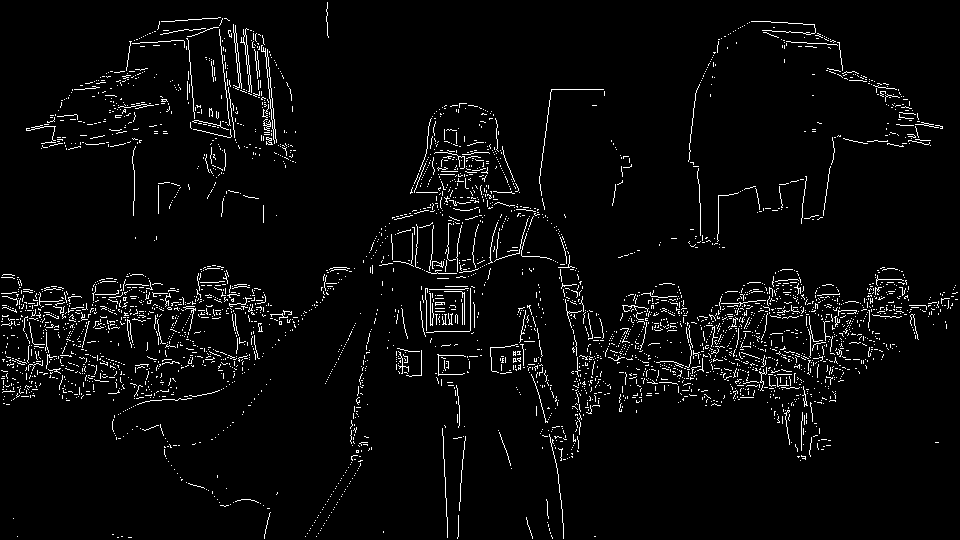

In [9]:
image = canny.threshold(threshold=0.055)
display(image)

## Powiększenie wykrytych krawędzi do wejściowego rozmiaru obrazu (upscaling)

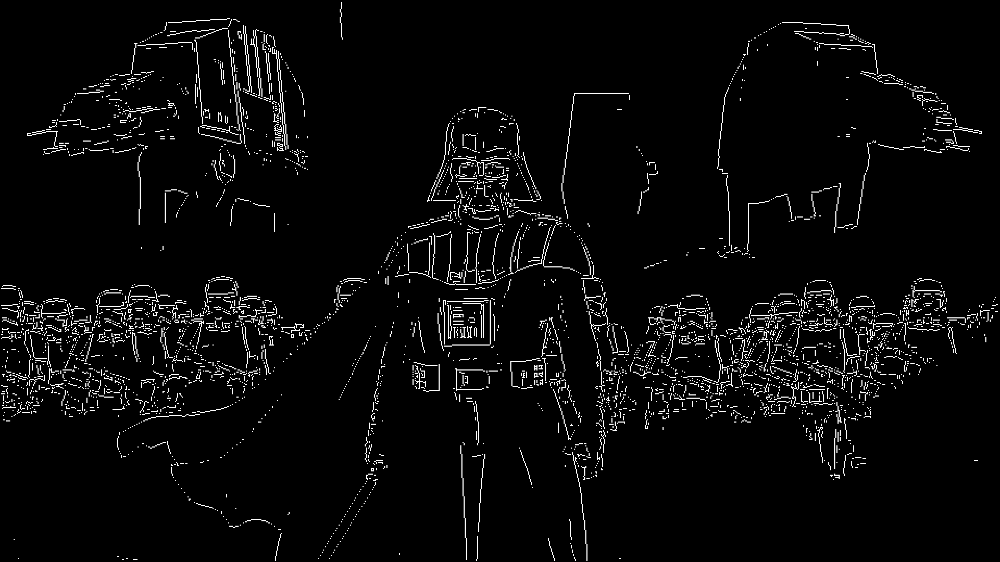

In [10]:
image = upscale(
    image, target_size=(base_image.shape[1], base_image.shape[2])
)
display(image)

## Nałożenie krawędzi na obraz

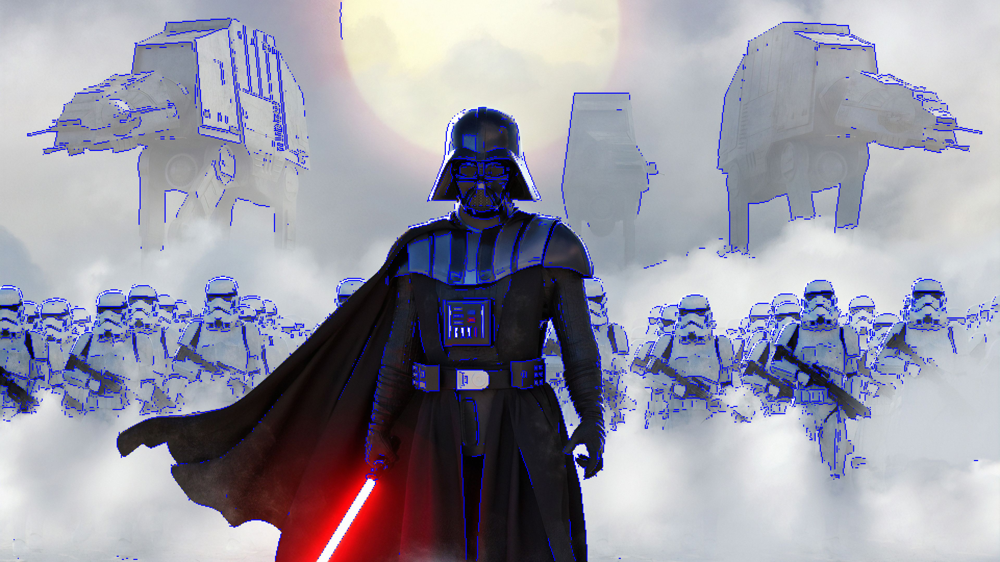

In [11]:
image = apply_detected_edges_to_image(base_image, image)
display(image)

Widać, że krawędzie zostały wykryte dobrze, pozycje pokrywają się z krawędziami
na obrazie wejściowym — natomiast nie zostały idealne wykryte. Wynika to między
innymi z dość jednolitego tła.